## Settings
Set global settings, used in the following.

In [36]:
COLOR_SPACE = 'YUV' # Can be RGB, HSV, LUV, HLS, YUV, YCrCb
ORIENT = 11 # HOG orientations
PIX_PER_CELL = 16 # HOG pixels per cell
CELL_PER_BLOCK = 2 # HOG cells per block
HOG_CHANNEL = "ALL" # Can be 0, 1, 2, or "ALL"
SPATIAL_SIZE = (4, 4) # Spatial binning dimensions
HIST_BINS = 16    # Number of histogram bins
SPATIAL_FEAT = False # Spatial features on or off
HIST_FEAT = False # Histogram features on or off
HOG_FEAT = True # HOG features on or off
Y_START_STOP = [400, 720] # Min and max in y to search in slide_window()
BASE_DIR = "data/**/*.png"
N_SUB = -1  # Debugging, use less training data

## ETL

Get all image files for training.

In [37]:
import glob  # importing mass data
import matplotlib.image as mpimg
import numpy as np
import cv2
from skimage.feature import hog
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import time

In [82]:
# Copied from lesson_functions.py

# Define a function to return HOG features and visualization
def get_hog_features(img, orient, pix_per_cell, cell_per_block,
                        vis=False, feature_vec=True):
    # Call with two outputs if vis==True
    if vis == True:
        features, hog_image = hog(img, orientations=orient,
                                  pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),
                                  transform_sqrt=True,
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:
        features = hog(img, orientations=orient,
                       pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block),
                       transform_sqrt=True,
                       visualise=vis, feature_vector=feature_vec)
        return features

# Define a function to compute binned color features
def bin_spatial(img, size=(32, 32)):
    # Use cv2.resize().ravel() to create the feature vector
    features = cv2.resize(img, size).ravel()
    # Return the feature vector
    return features

# Define a function to compute color histogram features
# NEED TO CHANGE bins_range if reading .png files with mpimg!
def color_hist(img, nbins=32, bins_range=(0, 256)):
    # Compute the histogram of the color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=nbins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=nbins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=nbins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

# Define a function to extract features from a list of images
# Have this function call bin_spatial() and color_hist()
def extract_features(imgs, color_space='RGB', spatial_size=(32, 32),
                     hist_bins=32, orient=9,
                     pix_per_cell=8, cell_per_block=2, hog_channel=0,
                     spatial_feat=True, hist_feat=True, hog_feat=True,
                     use_hog=True, use_hist=True, use_spatial=True
                    ):
    # Create a list to append feature vectors to
    features = []
    # Iterate through the list of images
    for file in imgs:
        file_features = []
        # Read in each one by one
        image = mpimg.imread(file)
        # apply color conversion if other than 'RGB'
        if color_space != 'RGB':
            if color_space == 'HSV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
            elif color_space == 'LUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
            elif color_space == 'HLS':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
            elif color_space == 'YUV':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
            elif color_space == 'YCrCb':
                feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
        else: feature_image = np.copy(image)

        if spatial_feat == use_spatial:
            spatial_features = bin_spatial(feature_image, size=spatial_size)
            file_features.append(spatial_features)
        if hist_feat == use_hist:
            # Apply color_hist()
            hist_features = color_hist(feature_image, nbins=hist_bins)
            file_features.append(hist_features)
        if hog_feat == use_hog:
        # Call get_hog_features() with vis=False, feature_vec=True
            if hog_channel == 'ALL':
                hog_features = []
                for channel in range(feature_image.shape[2]):
                    hog_features.append(get_hog_features(feature_image[:,:,channel],
                                        orient, pix_per_cell, cell_per_block,
                                        vis=False, feature_vec=True))
                hog_features = np.ravel(hog_features)
            else:
                hog_features = get_hog_features(feature_image[:,:,hog_channel], orient,
                            pix_per_cell, cell_per_block, vis=False, feature_vec=True)
            # Append the new feature vector to the features list
            file_features.append(hog_features)
        features.append(np.concatenate(file_features))
    # Return list of feature vectors
    return features

In [83]:
# Divide up into cars and notcars
def get_X_y(base_dir=BASE_DIR, use_hog=True, use_hist=True, use_spatial=True, pretrained_scaler=None):
    images = glob.glob(base_dir, recursive=True)
    cars = []
    notcars = []
    for image in images:
        if 'non-vehicles' in image:
            notcars.append(image)
        else:
            cars.append(image)

    if N_SUB > 0:
        sample_size = N_SUB
        cars = cars[0:sample_size]
        notcars = notcars[0:sample_size]

    # get the features from the isk
    t=time.time()
    car_features = extract_features(cars, color_space=COLOR_SPACE, orient=ORIENT,
                                    pix_per_cell=PIX_PER_CELL, cell_per_block=CELL_PER_BLOCK,
                                    hog_channel=HOG_CHANNEL, 
                                    use_hog=use_hog, use_hist=use_hist, use_spatial=use_spatial)
    notcar_features = extract_features(notcars, color_space=COLOR_SPACE, orient=ORIENT,
                                    pix_per_cell=PIX_PER_CELL, cell_per_block=CELL_PER_BLOCK,
                                    hog_channel=HOG_CHANNEL, 
                                    use_hog=use_hog, use_hist=use_hist, use_spatial=use_spatial)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to extract features...')
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)
    # Fit a per-column scaler
    if pretrained_scaler == None:
        X_scaler = StandardScaler().fit(X)
    else:
        print("using pretrained scaler.")
        X_scaler = pretrained_scaler
    # Apply the scaler to X
    scaled_X = X_scaler.transform(X)

    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), np.zeros(len(notcar_features))))
    
    return scaled_X, y, X_scaler

scaled_X, y, X_scaler = get_X_y(BASE_DIR, use_hog=HOG_FEAT, use_hist=HIST_FEAT, use_spatial=SPATIAL_FEAT)

54.87 Seconds to extract features...


## Train a model 

In [88]:
import sklearn.svm as svm
from sklearn.model_selection import train_test_split

In [89]:
# Split up data into randomized training and test sets
rand_state = np.random.randint(42)
X_train, X_test, y_train, y_test = train_test_split(
    scaled_X, y, test_size=0.2, random_state=rand_state)

def train_model(X_train, y_train):
    print('Using:',ORIENT,'orientations',PIX_PER_CELL,
    'pixels per cell and', CELL_PER_BLOCK,'cells per block')
    print('Feature vector length:', len(X_train[0]))
    # Use a linear SVC
    svc = svm.LinearSVC()
    # Check the training time for the SVC
    t=time.time()
    svc.fit(X_train, y_train)
    t2 = time.time()
    print(round(t2-t, 2), 'Seconds to train SVC...')
    
    return svc

svc = train_model(X_train, y_train)

def test_model(mdl, X_test, y_test, n_predict=10):
    # Check the score of the SVC
    print('Test Accuracy of SVC = ', round(mdl.score(X_test, y_test), 4))
    # Check the prediction time for a single sample
    t=time.time()
    print('My SVC predicts: ', svc.predict(X_test[0:n_predict]))
    print('For these',n_predict, 'labels: ', y_test[0:n_predict])
    t2 = time.time()
    print(round(t2-t, 5), 'Seconds to predict', n_predict,'labels with SVC')
    
test_model(svc, X_test, y_test)

Using: 11 orientations 16 pixels per cell and 2 cells per block
Feature vector length: 1188
2.81 Seconds to train SVC...
Test Accuracy of SVC =  0.9747
My SVC predicts:  [ 0.  1.  1.  0.  1.  0.  1.  1.  0.  0.]
For these 10 labels:  [ 0.  1.  1.  0.  1.  0.  1.  1.  0.  0.]
0.001 Seconds to predict 10 labels with SVC


Also, test on own debug data:

In [96]:
scaled_X_dbg, y_dbg, X_scaler_dummy = get_X_y(base_dir="debug/**/*.png", 
                                              use_hog=HOG_FEAT, use_hist=HIST_FEAT, use_spatial=SPATIAL_FEAT,
                                              pretrained_scaler = X_scaler)
test_model(svc, scaled_X_dbg, y_dbg, n_predict=60)

0.08 Seconds to extract features...
using pretrained scaler.
Test Accuracy of SVC =  0.75
My SVC predicts:  [ 0.  0.  0.  0.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
For these 60 labels:  [ 1.  1.  1.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.]
0.001 Seconds to predict 60 labels with SVC


## Test on /test_images

1280

In [416]:
# methods copied from lesson_functiony.py

# Define a function to draw bounding boxes
def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    # Make a copy of the image
    imcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imcopy, bbox[0], bbox[1], color, thick)
    # Return the image copy with boxes drawn
    return imcopy


def slide_window(self, img, x_start_stop=[None, None], y_start_stop=[None, None],
                      xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
        """
        Define a function that takes an image,
        start and stop positions in both x and y,
        window size (x and y dimensions),
        and overlap fraction (for both x and y)
        :param img:
        :param x_start_stop:
        :param y_start_stop:
        :param xy_window:
        :param xy_overlap:
        :return:
        """
        # If x and/or y start/stop positions not defined, set to image size
        if x_start_stop[0] == None:
            x_start_stop[0] = 0
        if x_start_stop[1] == None:
            x_start_stop[1] = img.shape[1]
        if y_start_stop[0] == None:
            y_start_stop[0] = 0
        if y_start_stop[1] == None:
            y_start_stop[1] = img.shape[0]
        # Compute the span of the region to be searched
        xspan = x_start_stop[1] - x_start_stop[0]
        yspan = y_start_stop[1] - y_start_stop[0]
        # Compute the number of pixels per step in x/y
        nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
        ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
        # Compute the number of windows in x/y
        nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
        ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
        nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step)
        ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step)
        # Initialize a list to append window positions to
        window_list = []
        # Loop through finding x and y window positions
        # Note: you could vectorize this step, but in practice
        # you'll be considering windows one by one with your
        # classifier, so looping makes sense
        for ys in range(ny_windows):
            for xs in range(nx_windows):
                # Calculate window position
                startx = xs*nx_pix_per_step + x_start_stop[0]
                endx = startx + xy_window[0]
                starty = ys*ny_pix_per_step + y_start_stop[0]
                endy = starty + xy_window[1]

                # Append window position to list
                window_list.append(((startx, starty), (endx, endy)))
        # Return the list of windows, which is basically a subset of images
        return window_list
    
# Define a single function that can extract features using hog sub-sampling and make predictions
def find_cars(img, ystart, ystop,
              cspace, scale, svc, X_scaler, orient, pix_per_cell, cell_per_block, spatial_size, hist_bins,
              xstart=None, xstop=None,
              hog_channel="ALL",
              use_hist=True, use_spatial=True, use_hog=True,
              show_rects=False, debug=False):
    global test_features
    global subimg
    global ctrans_tosearch
    
    draw_img = np.copy(img)
    
    if np.max(img) > 1:
        img = img.astype(np.float32)/255
    else:
        img = img.astype(np.float32)

    if xstart == None:
        xstart = 0
    if xstop == None:
        xstop = image.shape[1]
        
    img_tosearch = img[ystart:ystop,xstart:xstop,:]
    
    if debug:
        plt.imshow(img_tosearch)
        plt.title("subimage to be searched")
        plt.show()

    # apply color conversion if other than 'RGB'
    if cspace != 'RGB':
        if cspace == 'HSV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HSV)
        elif cspace == 'LUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2LUV)
        elif cspace == 'HLS':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2HLS)
        elif cspace == 'YUV':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YUV)
        elif cspace == 'YCrCb':
            ctrans_tosearch = cv2.cvtColor(img_tosearch, cv2.COLOR_RGB2YCrCb)
    else: ctrans_tosearch = np.copy(image)   
    
    if scale != 1:
        imshape = ctrans_tosearch.shape
        ctrans_tosearch = cv2.resize(ctrans_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    ch1 = ctrans_tosearch[:,:,0]
    ch2 = ctrans_tosearch[:,:,1]
    ch3 = ctrans_tosearch[:,:,2]

    # Define blocks and steps as above
    nxblocks = (ch1.shape[1] // pix_per_cell) - cell_per_block + 3  # dont know, but it works
    nyblocks = (ch1.shape[0] // pix_per_cell) - cell_per_block + 3  # dont know, but it works
    nfeat_per_block = orient*cell_per_block**2

    # 64 was the orginal sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2  # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step

    # Compute individual channel HOG features for the entire image
    hog1 = get_hog_features(ch1, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog2 = get_hog_features(ch2, orient, pix_per_cell, cell_per_block, feature_vec=False)
    hog3 = get_hog_features(ch3, orient, pix_per_cell, cell_per_block, feature_vec=False)

    # result
    rectangles = []
    for xb in range(nxsteps):
        for yb in range(nysteps):
            test_features = []
            
            ypos = yb*cells_per_step
            xpos = xb*cells_per_step
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell

            # Extract the image patch
            subimg = cv2.resize(ctrans_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64))
            if debug:
                plt.imshow(cv2.resize(img_tosearch[ytop:ytop+window, xleft:xleft+window], (64,64)))
                plt.show()

            # Get color features
            if use_spatial:
                spatial_features = bin_spatial(subimg, size=spatial_size)
                test_features.append(spatial_features)
            
            if use_hist:
                hist_features = color_hist(subimg, nbins=hist_bins)
                test_features.append(hist_features)
                
            # Extract HOG for this patch
            if use_hog:
                if hog_channel == "ALL":
                    hog_feat1 = hog1[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                    hog_feat2 = hog2[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                    hog_feat3 = hog3[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel()
                    hog_features = np.hstack((hog_feat1, hog_feat2, hog_feat3))
                else:
                    if hog_channel==0:
                        hog_features=hog_feat1
                    if hog_channel==1:
                        hog_features=hog_feat2
                    if hog_channel==2:
                        hog_features=hog_feat3
                test_features.append(hog_features)
                        
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.array(test_features).reshape(1, -1))
            # test_features = X_scaler.transform(np.hstack((spatial_features, hist_features, hog_features)).reshape(1, -1))
            #test_features = X_scaler.transform(np.hstack((shape_feat, hist_feat)).reshape(1, -1))
            test_prediction = svc.predict(test_features)

            if test_prediction == 1 or show_rects:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                rectangles.append(((xbox_left+xstart, ytop_draw+ystart),(xbox_left+xstart+win_draw,ytop_draw+win_draw+ystart)))
                
    return rectangles

In [247]:
# this function simply wraps parameters to make calling easier.
def get_rects_wrapper(image, scale=2.5, ystart=360, ystop=656, xstart=None, xstop=None, show_all=False):
    rects = find_cars(image,
                       ystart=ystart, 
                       ystop=ystop, 
                       xstart=xstart,
                       xstop=xstop,
                       cspace=COLOR_SPACE,
                       scale = scale, 
                       svc=svc, 
                       X_scaler = X_scaler, 
                       orient = ORIENT, 
                       pix_per_cell = PIX_PER_CELL, 
                       cell_per_block = CELL_PER_BLOCK, 
                       spatial_size = SPATIAL_SIZE, 
                       hist_bins = HIST_BINS,
                       hog_channel=HOG_CHANNEL,
                       use_hist=HIST_FEAT, use_spatial=SPATIAL_FEAT, use_hog=HOG_FEAT,
                       show_rects=show_all)
    
    return rects

scaling by 255
yay! found 2 rectangles


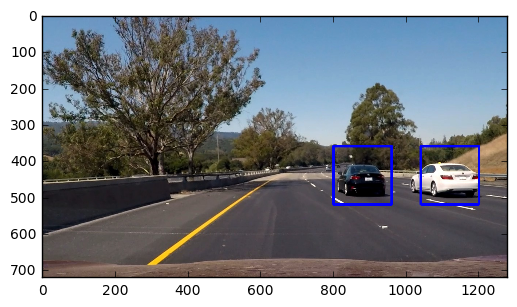

In [248]:
image = mpimg.imread("test_images/test6.jpg")
rects = get_rects_wrapper(image)
draw_img = image.copy()

if len(rects) > 0:
    print("yay! found {} rectangles".format(len(rects)))
else:
    print("no rectangles found...")

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.show()

OK! Now that the first test is sucessfull, we need to figure out working values for scale, ystart and ystop.

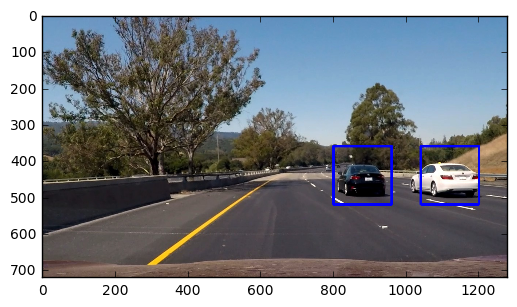

In [249]:
draw_img = image.copy()

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.show()

scaling by 255


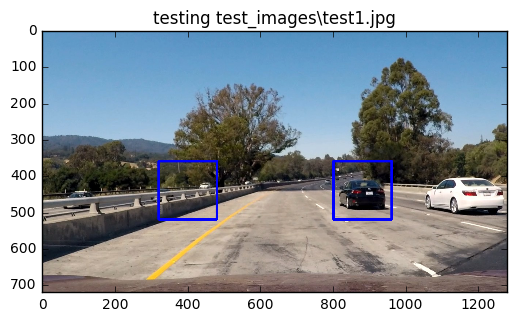

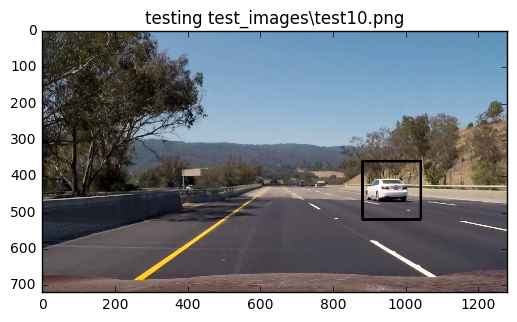

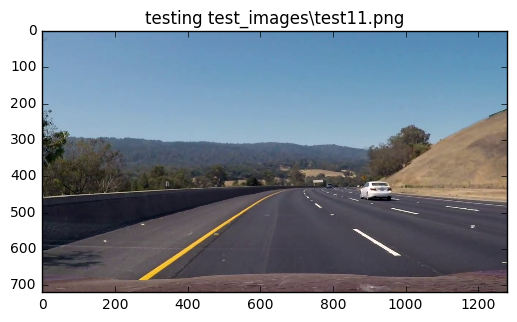

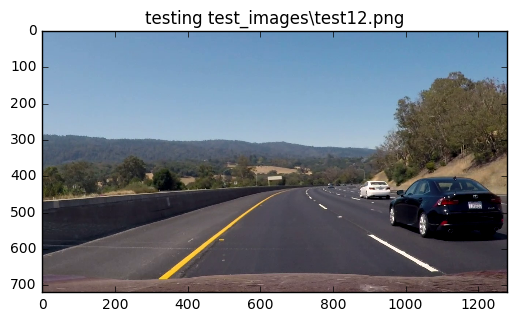

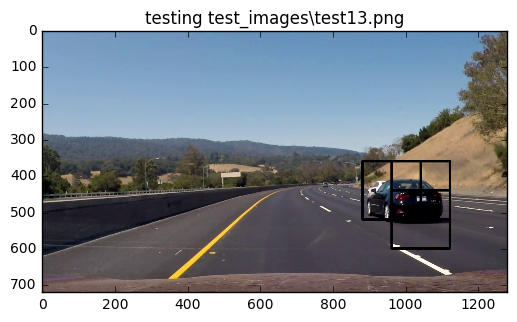

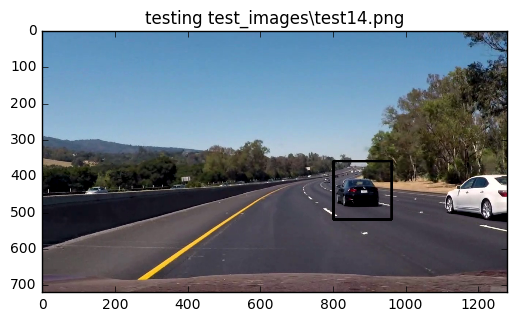

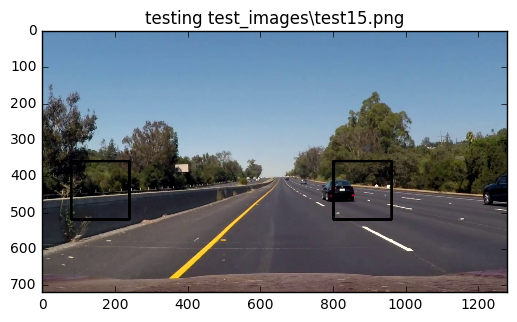

scaling by 255


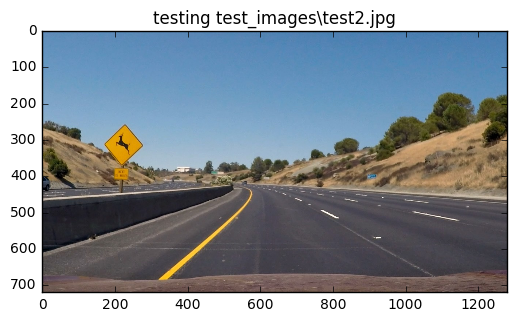

scaling by 255


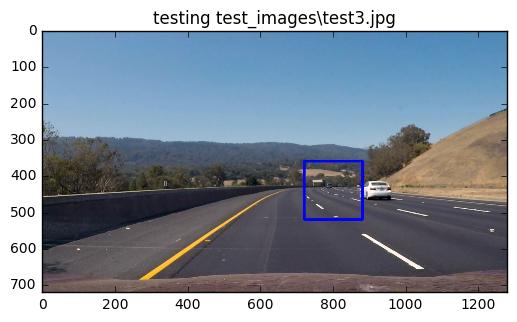

scaling by 255


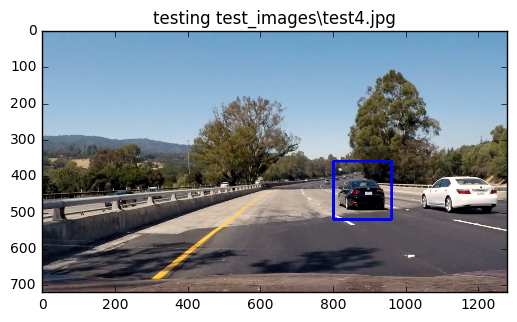

scaling by 255


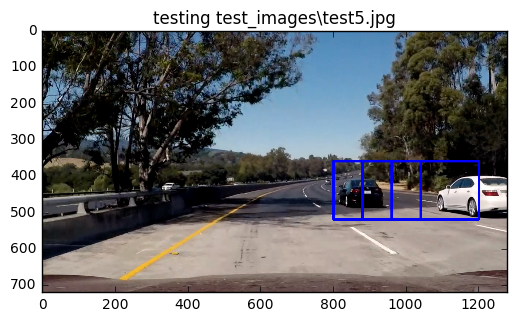

scaling by 255


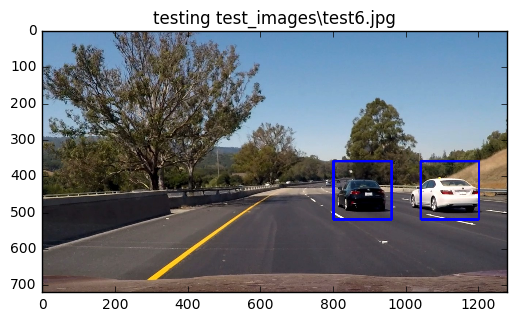

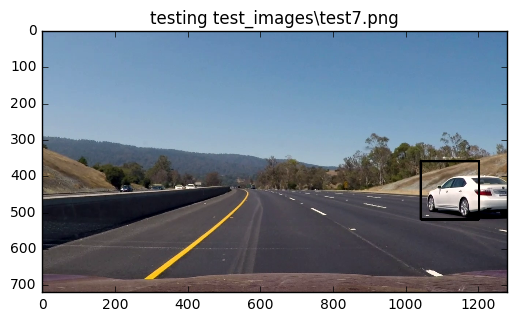

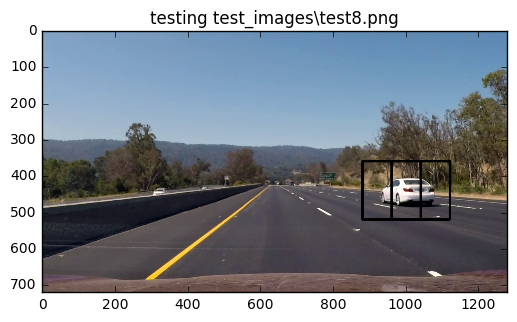

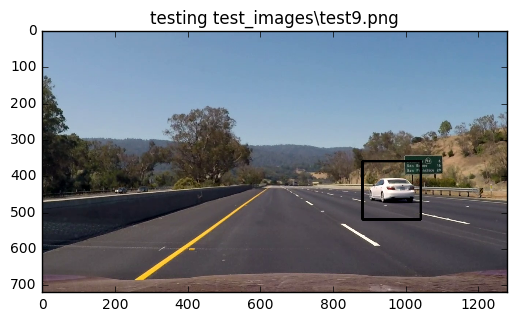

In [250]:
for test_img in glob.glob("test_images/*", recursive=True):
    image = mpimg.imread(test_img)
    draw_img = image.copy()
    rects = get_rects_wrapper(image)
    for rect in rects:
        draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

    plt.imshow(draw_img)
    plt.title("testing {}".format(test_img))
    plt.show()

We are going to use three different distances for testing:

- test12.png (close)
- test16.png (medium-distant)
- test12 (distant)

yay! found 9 rectangles


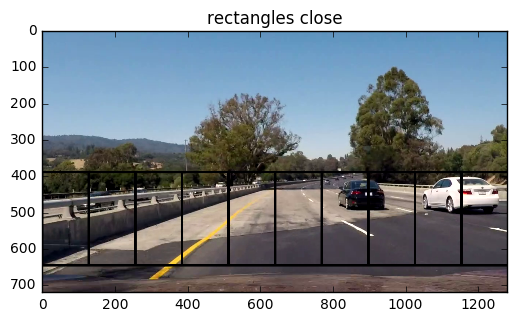

In [432]:
image = mpimg.imread("test_images/test12.png")
rects = get_rects_wrapper(image, scale=4, ystart=390, ystop=720, xstart=None, xstop=None, show_all=True)
#rects = np.concatenate([rects, get_rects_wrapper(image, scale=4, ystart=330, ystop=720, xstart=50, xstop=None, show_all=True)])
draw_img = image.copy()

if len(rects) > 0:
    print("yay! found {} rectangles".format(len(rects)))
else:
    print("no rectangles found...")

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.title("rectangles close")
plt.show()

yay! found 10 rectangles


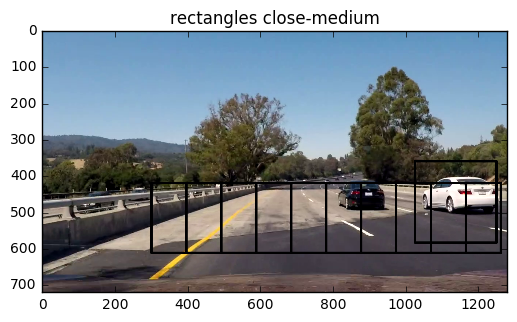

In [463]:
image = mpimg.imread("test_images/test16.png")
ystart = 360
ystop = 600
xstart = 240
xstop = 1100
delta = 60
rects = get_rects_wrapper(image, scale=3.5, ystart=ystart, ystop=ystop, xstart=xstart, xstop=None, show_all=True)
new_rects = get_rects_wrapper(image, scale=3, ystart=ystart+delta, ystop=ystop+delta,
                                  xstart=xstart+delta, xstop=None, show_all=True)
rects = rects_joiner_helper(rects, new_rects)
    
draw_img = image.copy()

if len(rects) > 0:
    print("yay! found {} rectangles".format(len(rects)))
else:
    print("no rectangles found...")

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.title("rectangles close-medium")
plt.show()

yay! found 52 rectangles


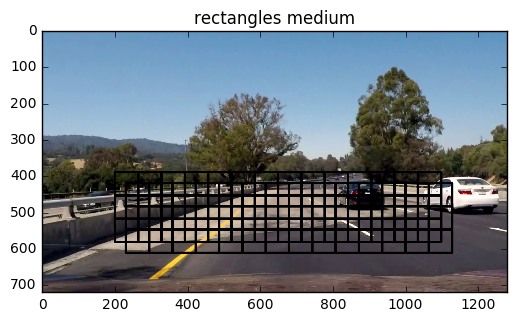

In [436]:
image = mpimg.imread("test_images/test9.png")
ystart = 390
ystop = 600
xstart = 200
xstop = 1100
delta = 30
rects = get_rects_wrapper(image, scale=2, ystart=ystart, ystop=ystop, xstart=xstart, xstop=xstop, show_all=True)
rects = np.concatenate([rects, get_rects_wrapper(image, scale=2, 
                                                 ystart=ystart+delta, ystop=ystop+delta, 
                                                 xstart=xstart+delta, xstop=xstop+delta, show_all=True)])
draw_img = image.copy()

if len(rects) > 0:
    print("yay! found {} rectangles".format(len(rects)))
else:
    print("no rectangles found...")

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.title("rectangles medium")
plt.show()

yay! found 34 rectangles


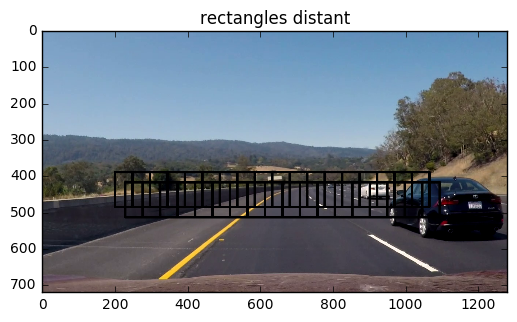

In [353]:
image = mpimg.imread("test_images/test12.png")
ystart = 390
ystop = 500
xstart = 200
xstop = 1100
delta = 28
rects = get_rects_wrapper(image, scale=1.5, ystart=ystart, ystop=ystop, xstart=xstart, xstop=xstop, show_all=True)
rects = np.concatenate([rects, get_rects_wrapper(image, scale=1.5, 
                                                 ystart=ystart+delta, ystop=ystop+delta, 
                                                 xstart=xstart+delta, xstop=xstop+delta, show_all=True)])
draw_img = image.copy()

if len(rects) > 0:
    print("yay! found {} rectangles".format(len(rects)))
else:
    print("no rectangles found...")

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.title("rectangles distant")
plt.show()

In [464]:
# this function simply wraps parameters to make calling easier.

def rects_joiner_helper(rects, new_rects):
    if len(rects) == 0 and len(new_rects) == 0:
        return []
    elif len(rects) == 0:
        return new_rects
    elif len(new_rects) == 0:
        return rects
    else:
        return np.vstack([rects, new_rects])

def get_rects_wrapper_adaptive(image, show_all=False):
    global rects
    global new_rects 
    # close
    rects = get_rects_wrapper(image, scale=4, ystart=390, ystop=720, xstart=None, xstop=None, show_all=show_all)
    
    # close-medium
    ystart = 360
    ystop = 600
    xstart = 240
    xstop = 1100
    delta = 60
    new_rects = get_rects_wrapper(image, scale=3, ystart=ystart, ystop=ystop, xstart=xstart, xstop=None, show_all=show_all)
    rects = rects_joiner_helper(rects, new_rects)
    new_rects = get_rects_wrapper(image, scale=3, ystart=ystart+delta, ystop=ystop+delta,
                                      xstart=xstart+delta, xstop=None, show_all=show_all)
    rects = rects_joiner_helper(rects, new_rects)
    
    # medium
    ystart = 390
    ystop = 600
    xstart = 200
    xstop = 1100
    delta = 30
    new_rects = get_rects_wrapper(image, scale=2, ystart=ystart, 
                              ystop=ystop, xstart=xstart, xstop=xstop, show_all=show_all)
    rects = rects_joiner_helper(rects, new_rects)
    new_rects = get_rects_wrapper(image, scale=2, ystart=ystart+delta, ystop=ystop+delta,
                                  xstart=xstart+delta, xstop=xstop+delta, show_all=show_all)
    rects = rects_joiner_helper(rects, new_rects)
    
    # distant
    ystart = 390
    ystop = 500
    xstart = 200
    xstop = 1100
    delta = 28
    new_rects = get_rects_wrapper(image, scale=1.5, ystart=ystart,
                                  ystop=ystop, xstart=xstart, xstop=xstop, show_all=show_all)
    rects = rects_joiner_helper(rects, new_rects)
    new_rects = get_rects_wrapper(image, scale=1.5, ystart=ystart+delta, ystop=ystop+delta,
                                  xstart=xstart+delta, xstop=xstop+delta, show_all=show_all)
    rects = rects_joiner_helper(rects, new_rects)
    
    return rects

yay! found 4 rectangles


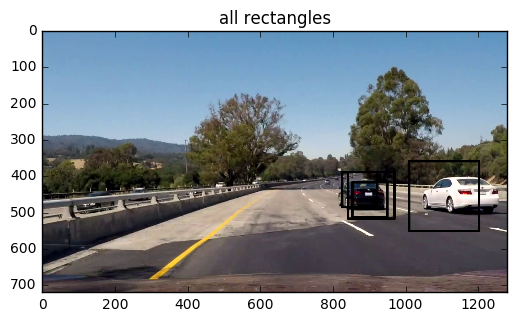

In [465]:
image = mpimg.imread("test_images/test16.png")
rects = get_rects_wrapper_adaptive(image, show_all=False)
draw_img = image.copy()

if len(rects) > 0:
    print("yay! found {} rectangles".format(len(rects)))
else:
    print("no rectangles found...")

for rect in rects:
    draw_img = cv2.rectangle(draw_img,(rect[0][0], rect[0][1]),(rect[1][0],rect[1][1]),(0,0,255),6)

plt.imshow(draw_img)
plt.title("all rectangles")
plt.show()

So far, so good. Now that's apply some heat to accumulate hits.

## Heatin' it up 

In [322]:
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
import numpy as np
import pickle
import cv2
from scipy.ndimage.measurements import label

def add_heat(heatmap, bbox_list):
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside each bbox
        # Assuming each "box" takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1

    # Return updated heatmap
    return heatmap # Iterate through list of bboxes

def apply_threshold(heatmap, threshold):
    # Zero out pixels below the threshold
    heatmap[heatmap <= threshold] = 0
    # Return thresholded map
    return heatmap

def draw_labeled_bboxes(img, labels):
    # Iterate through all detected cars
    for car_number in range(1, labels[1]+1):
        # Find pixels with each car_number label value
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = ((np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy)))
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img

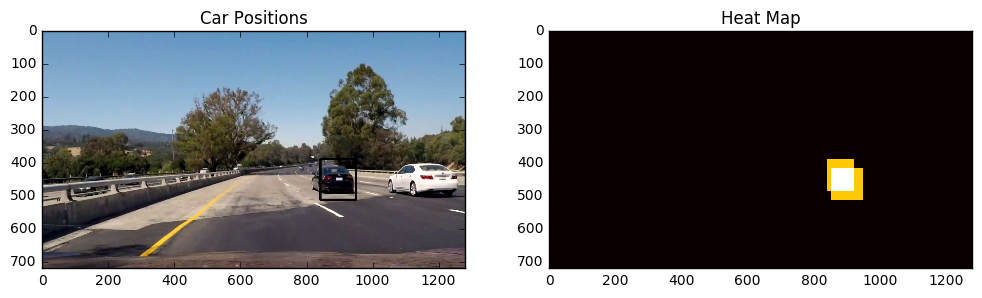

In [467]:
def get_cars_using_heatmap(image, rects, threshold=1):
    # Read in image similar to one shown above
    heat = np.zeros_like(image[:, :, 0]).astype(np.float)

    # Add heat to each box in box list
    heat = add_heat(heat, rects)

    # Apply threshold to help remove false positives
    heat = apply_threshold(heat, threshold)

    # Visualize the heatmap when displaying
    heatmap = np.clip(heat, 0, 255)

    # Find final boxes from heatmap using label function
    labels = label(heatmap)
    
    return labels, heatmap

labels, heatmap = get_cars_using_heatmap(image, rects)

draw_img = draw_labeled_bboxes(np.copy(image), labels)

plt.figure(figsize=(12, 6))
plt.subplot(121)
plt.imshow(draw_img)
plt.title('Car Positions')
plt.subplot(122)
plt.imshow(heatmap, cmap='hot')
plt.title('Heat Map')
plt.show()

## Setting up a pipeline 

In [468]:
class RectHistory:
    
    def __init__(self, buffer_length = 3):
        self.rect_hist = list()
        self.buffer_len = buffer_length
        
    def add(self, rects):
        """
        :param rects: a array specifying rects
        """
        self.rect_hist.append(rects)
        
        if len(self.rect_hist) > self.buffer_len:
            self.rect_hist.pop(0)  # pop first
        
    def get(self):
        return np.vstack(rh.rect_hist)

In [469]:
rh = RectHistory(3)

def process_image(image):
    global rh
    
    # get all rects for different distances and add to history
    rects = get_rects_wrapper_adaptive(image)
    rh.add(rects)
    
    # get history
    rect_hist = rh.get()
    
    # get labels using heatmap method
    labels, heatmap = get_cars_using_heatmap(image, rects)
    
    # paint bounding boxes on image
    draw_img = draw_labeled_bboxes(np.copy(image), labels)
    
    return draw_img

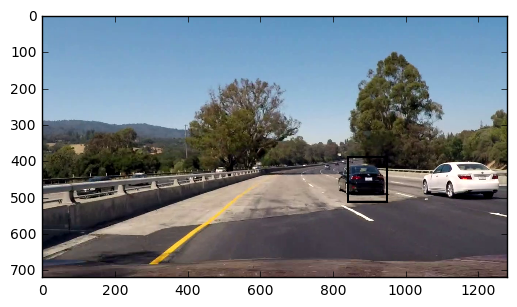

In [470]:
image = mpimg.imread("test_images/test16.png")
plt.imshow(process_image(image))
plt.show()

## Last test on test images

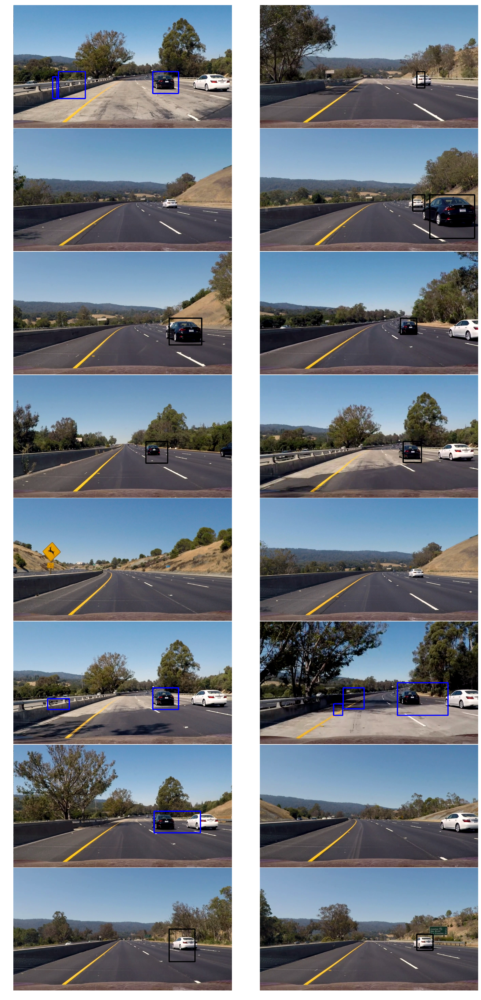

In [471]:
fig, axs = plt.subplots(8, 2, figsize=(20,40))
fig.subplots_adjust(hspace = .004, wspace=.002)
axs = axs.ravel()

for i, timg in enumerate(glob.glob('test_images/*')):
    rh = RectHistory(3)
    
    
    axs[i].imshow(process_image(mpimg.imread(timg)))
    axs[i].axis('off')
    
plt.show()

## Video 

In [428]:
from moviepy.editor import VideoFileClip
from IPython.display import HTML

In [472]:
rh = RectHistory(3)

test_out_file = "output/test_video.mp4"
clip_test = VideoFileClip("test_video.mp4")
clip_test_out = clip_test.fl_image(process_image)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video output/test_video.mp4
[MoviePy] Writing video output/test_video.mp4


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:09<00:00,  4.02it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/test_video.mp4 

Wall time: 11.2 s


In [474]:
rh = RectHistory(5)

test_out_file = "output/test_video_5.mp4"
clip_test = VideoFileClip("test_video.mp4")
clip_test_out = clip_test.fl_image(process_image)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video output/test_video_5.mp4
[MoviePy] Writing video output/test_video_5.mp4


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:10<00:00,  3.99it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output/test_video_5.mp4 

Wall time: 11.6 s


In [475]:
rh = RectHistory(5)

test_out_file = "output/project_video.mp4"
clip_test = VideoFileClip("project_video.mp4")
clip_test_out = clip_test.fl_image(process_image)
%time clip_test_out.write_videofile(test_out_file, audio=False)

[MoviePy] >>>> Building video output/project_video.mp4
[MoviePy] Writing video output/project_video.mp4


  0%|▏                                                                                | 3/1261 [00:00<05:50,  3.59it/s]

ValueError: all the input arrays must have same number of dimensions